In [1]:
import twint
import time
import pandas as pd
import re
import nltk 
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import sys
import os
import string
from PIL import Image
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import SnowballStemmer
import nest_asyncio
nest_asyncio.apply()

In [2]:
c = twint.Config()
c.Lang = "en"
c.Pandas = True
c.Search = '"Bitcoin" OR "Ethereum" OR "Cardano" OR "Solana" OR "Ripple"'
c.Limit = 60000
c.Since = "2022-04-01 00:00:00"

twint_df = twint.storage.panda.Tweets_df

c.Store_csv = True
c.Output = "CryptoTweetsDataset.csv"

twint.run.Search(c)

1525826421444190208 2022-05-15 15:12:22 +0200 <Tomorrow_newday> All Crypto Markets Will Crash Except Bitcoin You Will See 🤞
1525826420794064896 2022-05-15 15:12:21 +0200 <EvandroRoncatt6> #bitcoin geri dönüş bekliyorum kırmızı yuvarlak bölgesine. Eğer oraya gelip tepki alırsa yukarı doğru tekrar alım yaparım.  https://t.co/oFdgD8SKXC
1525826420039090179 2022-05-15 15:12:21 +0200 <chrstphrgnzlz> Check out this item on OpenSea  https://t.co/jHSuNUy0lL via @opensea  #opensea #ethereum #nonfungible #digitalasset #NFT #NFTart #NFTdrop #NFTcommunity #NFTcollection #NFTs #ETH
1525826416046231552 2022-05-15 15:12:20 +0200 <AndrewJardine9> Jardine found #ethereum in a User vault at this location! Join me playing #coinhuntworld, It's awesome!  https://t.co/mY9teDuqf4 #cryptocurrency #124778  https://t.co/RsWxyXl1Hb
1525826414058127360 2022-05-15 15:12:20 +0200 <Bradley98344762> Ethereum: The Dreaded C-wave Is Here . Two weeks ago, I showed Ethereum's (ETH) trend was not friendly and that “……  ht

In [15]:
twint_df = twint.storage.panda.Tweets_df
twint_df.columns
twint_df = twint_df[['id', "tweet",]]

In [16]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
stop = stopwords.words('english')

twint_df['stopwords'] = twint_df['tweet'].apply(lambda x: len([x for x in x.split() if x in stop]))
twint_df[['stopwords']].head()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ahmed\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
C:\Users\ahmed\AppData\Local\Temp\ipykernel_1188\1501616206.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twint_df['stopwords'] = twint_df['tweet'].apply(lambda x: len([x for x in x.split() if x in stop]))


,stopwords
0,0
1,0
2,0
3,0
4,0


In [17]:
re_stop_words = re.compile(r"\b(" + "|".join(stop_words) + ")\\W", re.I)
def removeStopWords(sentence):
    global re_stop_words
    return re_stop_words.sub(" ", sentence)

In [27]:
twint_df['tweet'] = twint_df['tweet'].apply(removeStopWords)
twint_df.shape
twint_df.head()

C:\Users\ahmed\AppData\Local\Temp\ipykernel_1188\4245249246.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twint_df['tweet'] = twint_df['tweet'].apply(removeStopWords)


,id,tweet,stopwords
0,1525826421444190208,Crypto Markets Crash Except Bitcoin See 🤞,0
1,1525826420794064896,#bitcoin geri dönüş bekliyorum kırmızı yuvarla...,0
2,1525826420039090179,Check item OpenSea https:// co/jHSuNUy0lL ...,0
3,1525826416046231552,Jardine found #ethereum User vault locatio...,0
4,1525826414058127360,"Ethereum: Dreaded C-wave . Two weeks ago, ...",0


In [19]:
def percentage(part,whole):
    return 100 * float(part)/float(whole)

In [29]:
positive = 0
negative = 0
neutral = 0
tweet_list = []
neutral_list = []
negative_list = []
positive_list = []

for i in range(twint_df.shape[0]):
    tweet_list.append(twint_df.tweet[i])
    score = SentimentIntensityAnalyzer().polarity_scores(twint_df.tweet[i])
    neg = score['neg']
    neu = score['neu']
    pos = score['pos']
    comp = score['compound']
 
    if neg > pos:
        negative_list.append(twint_df.tweet[i])
        negative += 1
    elif pos > neg:
        positive_list.append(twint_df.tweet[i])
        positive += 1
    elif pos == neg:
        neutral_list.append(twint_df.tweet[i])
        neutral += 1

positive = percentage(positive, twint_df.shape[0])
negative = percentage(negative, twint_df.shape[0])
neutral = percentage(neutral, twint_df.shape[0])
positive = format(positive, '.1f')
negative = format(negative, '.1f')
neutral = format(neutral, '.1f')

tweet_list = pd.DataFrame(tweet_list)
neutral_list = pd.DataFrame(neutral_list)
negative_list = pd.DataFrame(negative_list)
positive_list = pd.DataFrame(positive_list)
print("Total: ",len(tweet_list))
print("Positive: ",len(positive_list))
print("Negative: ", len(negative_list))
print("Neutral: ",len(neutral_list))

Total:  60004
Positive:  20279
Negative:  8103
Neutral:  31622


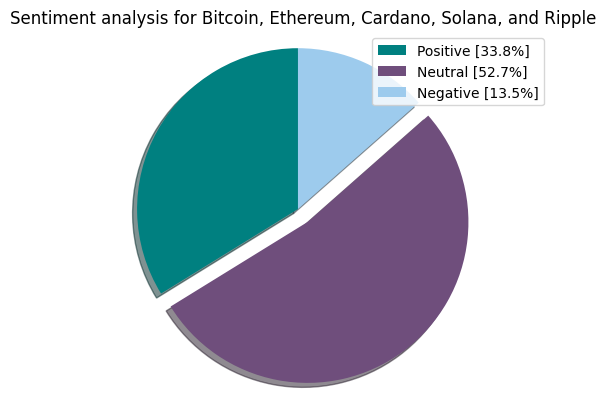

In [98]:
labels = ['Positive ['+str(positive)+'%]' , 'Neutral ['+str(neutral)+'%]','Negative ['+str(negative)+'%]']
sizes = [positive, neutral, negative]
explode = (0, 0.1, 0)  
colors = ['#008080', '#6f4e7c','#9dcbed']
patches, texts = plt.pie(sizes, colors=colors, startangle=90, explode = explode, shadow = True)
plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment analysis for Bitcoin, Ethereum, Cardano, Solana, and Ripple")
plt.axis('equal')
plt.show()

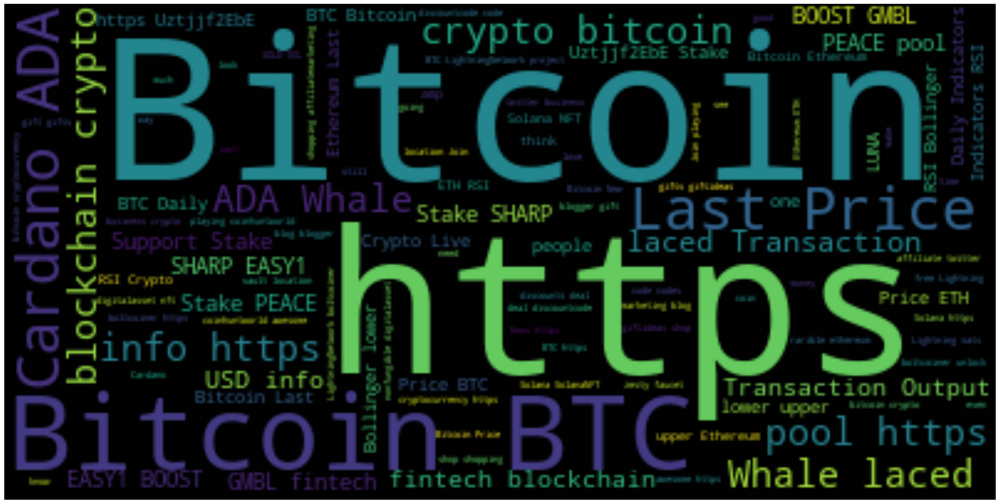

In [81]:
def create_wordcloud(text):
    stopwords = set(STOPWORDS)
    cleaned_word = " ".join([word for word in text.split()])
    wc = WordCloud(
    max_words=3000,
    min_word_length =3,
    collocation_threshold = 20,
    stopwords=stopwords,
    repeat=True)
    wc.generate(cleaned_word)
    
    return wc

wordcloud =  create_wordcloud(' '.join(twint_df['tweet']))
fig = plt.figure(1,figsize=(30, 50))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [82]:
# create a dictionary of word frequencies
text = ' '.join(negative_list[0])
text_dictionary = wordcloud.process_text(text)
# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq = wordcloud.words_

#print results
print("Most frequent words")
print(list(word_freq.items())[0:50])
print("Least frequent words")
print(list(word_freq.items())[-100:-50])

Most frequent words
[('Bitcoin', 2865), ('https', 2241), ('Luna', 413), ('people', 406), ('one', 308), ('amp', 297), ('money', 261), ('Solana', 255), ('think', 253), ('Cardano', 247), ('know', 237), ('see', 220), ('crypto', 216), ('even', 216), ('Bitcoin New', 206), ('ETH', 201), ('going', 201), ('BTC', 196), ('die', 193), ('make', 192), ('News https', 185), ('coin', 182), ('Ethereum', 178), ('bad', 177), ('time', 175), ('que', 174), ('need', 168), ('back', 168), ('much', 163), ('Bitcoin Ethereum', 163), ('stop', 160), ('Bitcoin BTC', 160), ('shit', 153), ('right', 151), ('year', 151), ('btc bitcoin', 145), ('never', 140), ('wrong', 139), ('still', 138), ('way', 138), ('bitcoin crypto', 136), ('want', 134), ('buy', 134), ('project', 131), ('day', 130), ('thing', 130), ('market', 128), ('take', 128), ('really', 126), ('work', 120)]
Least frequent words
[('sigue alli', 1), ('cqKBbZ4rBJ Bitcoin_Luke7', 1), ('Bitcoin_Luke7 Rainmaker1973', 1), ('matiwinnetou Reddspark1', 1), ('takecresponsi

In [ ]:
import sweetviz as sv

